# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), and so you have four options:
1. Use PaperSpace [as suggested for CW1](https://hackmd.io/@afspies/S1stL8Qnt)
2. Use Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
3. Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
4. Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is 19:00, Friday 24th February, 2022** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [ ]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [ ]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'jd22' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_cw_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

Mounted at /content/drive/


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 20
learning_rate = 1e-3
batch_size = 128 
latent_dim = 16    

# Additional Hyperparameters 
in_channels=1
out_channels=8 #
kernel_size=4

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])



# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim,in_channels,out_channels,kernel_size):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim
        self.in_channels=in_channels
        self.out_channels=out_channels
        self.kernel_size=kernel_size

        # Encoder
        self.convolution_enc=nn.Sequential(nn.Conv2d(self.in_channels, self.out_channels, self.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(self.out_channels),
        nn.ReLU(),

        nn.Conv2d(self.out_channels, self.out_channels*4, self.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(self.out_channels*4),
        nn.ReLU(),

        nn.Conv2d(self.out_channels*4, self.out_channels*8, self.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(self.out_channels*8),
        nn.ReLU(),

        nn.Conv2d(self.out_channels*8, self.out_channels*16, self.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(self.out_channels*16),
        nn.ReLU()

        )

        #Fully connected layers
        self.fc1 = nn.Linear(self.out_channels*16, 128)

        #Latent space
        self.fc_log_variance = nn.Linear(128, self.latent_dim)
        self.fc_mean = nn.Linear(128, self.latent_dim)
        self.fc2 = nn.Linear(self.latent_dim, self.out_channels*16)


        #Decoder
        self.convolution_dec=nn.Sequential(
        nn.ConvTranspose2d(self.out_channels*16, self.out_channels*16, self.kernel_size, stride=1, padding=0, bias=False),
        # nn.dropout(0.2)
        nn.ReLU(),

        nn.ConvTranspose2d(self.out_channels*16, self.out_channels*8, self.kernel_size, stride=2, padding=1, bias=False),
        # nn.dropout(0.2)
        nn.ReLU(),

        nn.ConvTranspose2d(self.out_channels*8, self.out_channels*4, self.kernel_size, stride=2, padding=2, bias=False),
        # nn.dropout(0.2)
 
        nn.ReLU(),

        nn.ConvTranspose2d(self.out_channels*4, self.in_channels, kernel_size, stride=2, padding=1, bias=False),
        nn.Sigmoid()


        )


        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        #Math of encoder = p(z|x)
        x = self.convolution_enc(x)

        #Reshape x
        x=F.adaptive_avg_pool2d(x, 1).reshape(x.shape[0], -1)     

        #hidden layer
        hidden_layer=self.fc1(x)

        #Mean and variance
        log_variance=self.fc_log_variance(hidden_layer)
        mean=self.fc_mean(hidden_layer)


        return mean, log_variance



        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #z = mu + sigma * epsilon
        #epsilon ~ N(0,1)
        #sigma = exp(logvar/2)

        #Sample epsilon
        epsilon = torch.randn_like(logvar)
        sigma = torch.exp(logvar/2)

        #Reparametrization trick
        z = mu + sigma * epsilon

        return z


        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        #p_theta(x|z)

        return  self.convolution_dec(z)



        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        #Encode
        mu, logvar = self.encode(x)

        #Reparametrize
        z = self.reparametrize(mu, logvar)
        z = self.fc2(z)
        z=z.view(-1, out_channels*16, 1, 1)


        #Decode
        x = self.convolution_dec(z)

        return x, mu, logvar
        


        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim=latent_dim,in_channels=in_channels,out_channels=out_channels,kernel_size=kernel_size).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 617840
VAE(
  (convolution_enc): Sequential(
    (0): Conv2d(1, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(8, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (fc1): Linear(in_features=128, out_features=128, bias=True)
  (fc_log_variance): Linear(in_features=128, out_features=16, bias=True)
  (fc_mean): Line

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        # #######################################################################
        
        # Reconstruction loss
        reconstruction_loss = F.binary_cross_entropy(recon_x, x, reduction='sum')

        # Kullback–Leibler divergence
        kl_Divergence= 0.5*torch.sum(torch.exp(logvar) + mu**2 -logvar - 1.0) 

        #Loss
        loss = reconstruction_loss + beta*kl_Divergence

        return reconstruction_loss,kl_Divergence,loss

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

#
model.train()
# <- You may wish to add logging info here
#Training logs
train_losses = []
train_reconstruction_losses = []
train_kl_Divergence_losses = []

# validation logs
val_loss = []
val_reconstruction_losses = []
val_kl_Divergence_losses = []
###########
beta=1
##########
for epoch in range(num_epochs):     
    # <- You may wish to add logging info here
    model.train()
    train_loss=0.0
    train_reconstruction_loss=0.0
    train_kl_Divergence_loss = 0.0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch): 
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################  
            img=data.to(device)

            
            recon_img, mu, logvar = model(img)

            data = img # Need at least one batch/random data with right shape -
                        # This is required to initialize to model properly below
                        # when we save the computational graph for testing (jit.save)
            #optimizer
            optimizer.zero_grad()

            #Loss
            reconstruction_loss,kl_Divergence,loss = loss_function_VAE(recon_img, img, mu, logvar, beta)
            loss = loss/img.shape[0]
            loss.backward()

            train_loss += loss.item()
            train_reconstruction_loss += reconstruction_loss / img.shape[0]
            train_kl_Divergence_loss += kl_Divergence / img.shape[0]
            optimizer.step()

        valid_loss=0.0
        val_reconstruction_loss=0
        val_kl_Divergence_loss = 0.0
        model.eval()
        with torch.no_grad():
            with tqdm.tqdm(loader_test, unit="batch") as tepoch_test: 
                for batch_idx, (data, _) in enumerate(tepoch_test):
                    
                    img = data.to(device)
                    data=img

                    optimizer.zero_grad()
                    
                    recon_img, mu, logvar = model(img)

                    #Loss
                    reconstruction_loss,kl_Divergence,loss = loss_function_VAE(recon_img, img, mu, logvar, beta)

                    loss = (loss) / img.shape[0]
                    
                    #Store losses
                    valid_loss += loss.item()
                    val_reconstruction_loss += reconstruction_loss / img.shape[0]
                    val_kl_Divergence_loss += kl_Divergence / img.shape[0]


        #Store losses
        train_losses.append(train_loss / len(loader_train.dataset))
        train_reconstruction_losses.append(train_reconstruction_loss / len(loader_train.dataset))
        train_kl_Divergence_losses.append(train_kl_Divergence_loss / len(loader_train.dataset))   

        val_loss.append(valid_loss / len(loader_test.dataset))
        val_reconstruction_losses.append(val_reconstruction_loss / len(loader_test.dataset))
        val_kl_Divergence_losses.append(val_kl_Divergence_loss / len(loader_test.dataset))
        print(f'Epoch {epoch+1} / {num_epochs} - Train loss: {round((train_loss / len(loader_train.dataset)),4)} - Valid loss: {round((valid_loss / len(loader_test.dataset)),4)}')



            #######################################################################
            #                       ** END OF YOUR CODE **
            ####################################################################### 
        if batch_idx % 20 == 0:
            tepoch.set_description(f"Epoch {epoch}")
            tepoch.set_postfix(loss=loss.item()/len(data))
    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')

100%|██████████| 79/79 [00:01<00:00, 65.06batch/s]


Epoch 1 / 20 - Train loss: 1.2256 - Valid loss: 0.9237


100%|██████████| 79/79 [00:01<00:00, 65.84batch/s]


Epoch 2 / 20 - Train loss: 0.898 - Valid loss: 0.8532


100%|██████████| 79/79 [00:01<00:00, 66.71batch/s]


Epoch 3 / 20 - Train loss: 0.8581 - Valid loss: 0.8369


100%|██████████| 79/79 [00:01<00:00, 65.25batch/s]


Epoch 4 / 20 - Train loss: 0.8372 - Valid loss: 0.8173


100%|██████████| 79/79 [00:01<00:00, 66.91batch/s]


Epoch 5 / 20 - Train loss: 0.8268 - Valid loss: 0.8099


100%|██████████| 79/79 [00:01<00:00, 65.56batch/s]


Epoch 6 / 20 - Train loss: 0.8168 - Valid loss: 0.7962


100%|██████████| 79/79 [00:01<00:00, 65.95batch/s]


Epoch 7 / 20 - Train loss: 0.8131 - Valid loss: 0.7924


100%|██████████| 79/79 [00:01<00:00, 65.25batch/s]


Epoch 8 / 20 - Train loss: 0.8037 - Valid loss: 0.787


100%|██████████| 79/79 [00:01<00:00, 65.40batch/s]


Epoch 9 / 20 - Train loss: 0.8002 - Valid loss: 0.7889


100%|██████████| 79/79 [00:01<00:00, 65.91batch/s]


Epoch 10 / 20 - Train loss: 0.7979 - Valid loss: 0.7862


100%|██████████| 79/79 [00:01<00:00, 66.07batch/s]


Epoch 11 / 20 - Train loss: 0.7961 - Valid loss: 0.7854


100%|██████████| 79/79 [00:01<00:00, 66.00batch/s]


Epoch 12 / 20 - Train loss: 0.7915 - Valid loss: 0.7794


100%|██████████| 79/79 [00:01<00:00, 65.11batch/s]


Epoch 13 / 20 - Train loss: 0.7895 - Valid loss: 0.7814


100%|██████████| 79/79 [00:01<00:00, 65.94batch/s]


Epoch 14 / 20 - Train loss: 0.7866 - Valid loss: 0.7752


100%|██████████| 79/79 [00:01<00:00, 65.81batch/s]


Epoch 15 / 20 - Train loss: 0.7849 - Valid loss: 0.7786


100%|██████████| 79/79 [00:01<00:00, 63.86batch/s]


Epoch 16 / 20 - Train loss: 0.7835 - Valid loss: 0.7707


100%|██████████| 79/79 [00:01<00:00, 66.87batch/s]


Epoch 17 / 20 - Train loss: 0.7826 - Valid loss: 0.7795


100%|██████████| 79/79 [00:01<00:00, 65.92batch/s]


Epoch 18 / 20 - Train loss: 0.7801 - Valid loss: 0.7789


100%|██████████| 79/79 [00:01<00:00, 66.00batch/s]


Epoch 19 / 20 - Train loss: 0.7777 - Valid loss: 0.77


100%|██████████| 79/79 [00:01<00:00, 65.60batch/s]


Epoch 20 / 20 - Train loss: 0.7783 - Valid loss: 0.7691


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here (you may not need to use this cell)

**YOUR ANSWER**

The loss function used for the VAE is defined as follows:
$$\mathcal{L} = \mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$
* Explaining choice of loss

The purpose of the loss function in VAEs is to encourage the latent space to be disentangled, and to be able to reconstruct the input data well, but also pertain the entire distribution and not overfit to only the image itself. Therefore, there are 2 parts to the loss function: Part 1- reconstruction loss  also called log-likelyhood loss and Part 2- KL divergence loss, which is used to encourage the latent space to be disentangled. 

The reconstruction loss measures the pixel-to-pixel difference of the reconstructed image with the original input image. This is defined as follows:
$$\mathcal{L} = \mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]$$


where the log likelihood term is given by:

$$ \log p_\theta(X \mid z) = \sum_{i=1}^n \log p_\theta(x_i \mid z)$$

The $p_\theta(x_i \mid z)$ in the log likelyhood loss was asssumed to be a Bernoulli distribution since the MNIST dataset consists of binary images (black and white pixels)- we therefore use the binary cross entropy loss (BCE) for $p_\theta(x_i \mid z)$. This assumption was confirmed to hold true based on the histogram of pixel instensities plotted below (MSE loss is commonly used for VAEs when the input data is continuous and the output is a deterministic reconstruction, but this is not the case for this dataset)



The KL divergence loss measures the similarity of two distributions and is used to encourage the latent space to be disentangled. The KL divergence loss is defined as follows:

$$ D_{K L}[q_\phi(z \mid X) \| p_\theta(z)] = \frac{1}{2} \sum_{i=1}^n \left(1 + \log(\sigma_i^2) - \mu_i^2 - \sigma_i^2\right)$$

$q_\phi(z \mid X)$ refers to the encoder distribution and $p_\theta(z)$ refers to the prior distribution. The prior distribution is assumed to be a standard normal distribution where $p_\theta(z) = \mathcal{N}(z \mid 0, I)$. This allows us to then analytically calculate the KL divergence loss as shown in the formula above.


* The VAE Prior

We chose an isotropic Gaussian prior, which encourages the model to learn a latent space that's similar to a standard normal distribution. This helps the model to separate different features in the latent space and improve its ability to represent the data.

Using a standard normal distribution has the added advantage of being easy to work with analytically, which is helpful when calculating the KL divergence. The KL divergence is a crucial part of the loss function, and finding it analytically allows us to calculate the gradient of the loss function more easily during the optimization process.

* The output data domain

The output domain is the same as the input domain because the model is trying to reconstruct the input image. The model is trained to minimize the reconstruction loss, which is the pixel-to-pixel difference between the reconstructed image and the original input image. In this case the output domain will take pixel values between 0 and 1, since the MNIST dataset consists of binary images (black and white pixels) and is asssumed to follow the bernoulli distribution. It is common practice to rescale the input data to a fixed range, such as [0, 1] or [-1, 1], to ensure that the data has a consistent range and is not affected by outliers and then re-scale the output. However in our problem, since all pixel values are within the range of [0-1] there is no need to scale the inputs and outputs


* Disentanglement in the latent space

The $\beta$ value connected to the KL divergence term controls the measure of disentanglement in the latent space. Entanglement in the latent space occurs when the latent features are dependant on each other which then leads to poor representation of the data. Disentanglment is the opposite behaviour where the latent features are independent of each other and therefore the model is able to represent the data well. Theoretically for $\beta$ values close to 0, the reconstructed images will be well represented but the generated images will be distorted. There will be no constraint to tells the model where should this embedding or feature lie in the latent space. This behavior is due to the lack of regularisation in the latent space and thus the model is unable to learn independant latent features due to entanglement. This is why it is important to have a KL term in the loss function.

For larger values of $\beta$, the KL term is weighted more. This allows the model to learn a latent space that approximates a standard normal distribution, which in turn encourages the model to learn independent latent features. This leads to better representation of the data, but too large $\beta$ values will result in the reconstructed images being distorted due to poorly reconstructed images. Emperically, I chose a $\beta$=1, which allows for sufficent disentanglement but not too overpowering

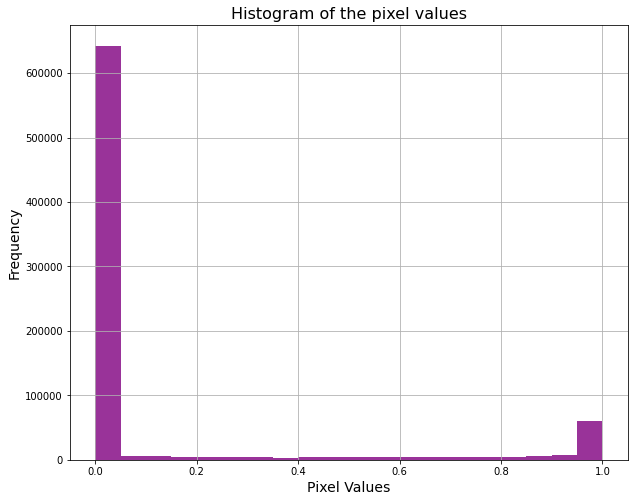

In [ ]:
# Check Bernoulli distribution assumption 
images_list = []

for i in range(1000):
    images_list.append(train_dat[i][0])

# Flatten the images to be one dimensional
images_list = torch.stack(images_list).view(-1)

# Plot the histogram of the flattened images
plt.figure(figsize=(10, 8))
plt.hist(images_list.numpy(), bins=20, color="purple", alpha=0.8)
plt.title('Histogram of the pixel values', fontsize=16)
plt.xlabel('Pixel Values', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True)
plt.show()


<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

In [ ]:
# Convert to numpy
for i in range(len(train_reconstruction_losses)):
    train_reconstruction_losses[i] = train_reconstruction_losses[i].detach().cpu().clone().numpy()+0
    train_kl_Divergence_losses[i] = train_kl_Divergence_losses[i].detach().cpu().clone().numpy()+0
    val_reconstruction_losses[i] = val_reconstruction_losses[i].detach().cpu().clone().numpy()+0
    val_kl_Divergence_losses[i] = val_kl_Divergence_losses[i].detach().cpu().clone().numpy()+0


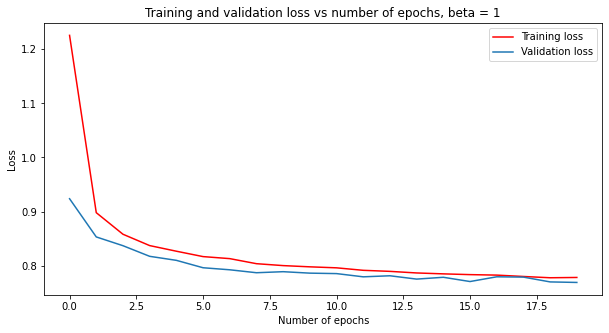

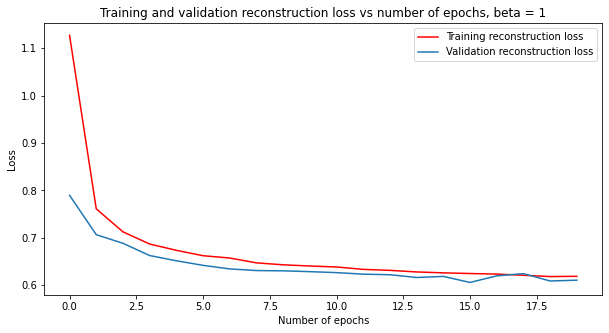

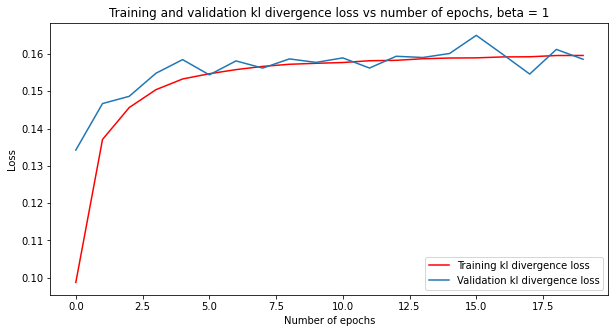

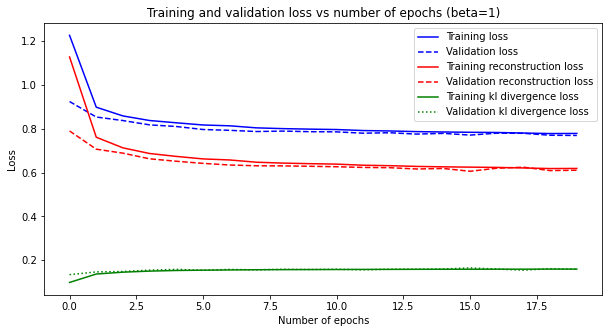

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*

#Plot training loss vs number of epochs
"""plot the training loss and test lost vs number of epochs with the following labels:
    - x-axis: number of epochs
    - y-axis: loss
    - title: Training and test loss vs number of epochs
    - legend: Training loss, Test loss
    """

plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training loss', color='red')
plt.plot(val_loss, label='Validation loss')
plt.legend()
plt.title(f'Training and validation loss vs number of epochs, beta = {beta}')
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.show()


#Plot train_reconstruction_losses  vs number of epochs
"""plot the train_reconstruction_losses  and test_reconstruction_losses  vs number of epochs with the following labels:
    - x-axis: number of epochs
    - y-axis: loss
    - title: Training and test reconstruction loss vs number of epochs
    - legend: Training reconstruction loss, Test reconstruction loss
    """
plt.figure(figsize=(10, 5))
plt.plot(train_reconstruction_losses, label='Training reconstruction loss', color='red')
plt.plot(val_reconstruction_losses, label='Validation reconstruction loss')
plt.legend()
plt.title(f'Training and validation reconstruction loss vs number of epochs, beta = {beta}')
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.show()


#Plot train_kl_Divergence_losses  vs number of epochs
"""plot the train_kl_Divergence_losses  and test_kl_Divergence_losses  vs number of epochs with the following labels:
    - x-axis: number of epochs
    - y-axis: loss
    - title: Training and test kl divergence loss vs number of epochs
    - legend: Training kl divergence loss, Test kl divergence loss
    """
plt.figure(figsize=(10, 5))
plt.plot(train_kl_Divergence_losses, label='Training kl divergence loss', color='red')
plt.plot(val_kl_Divergence_losses, label='Validation kl divergence loss')
plt.legend()
plt.title(f'Training and validation kl divergence loss vs number of epochs, beta = {beta}')
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.show()

#Plot all losses vs number of epochs in one plot
"""plot the train_kl_Divergence_losses  and test_kl_Divergence_losses  vs number of epochs with the following labels:
    - x-axis: number of epochs
    - y-axis: loss
    - title: Training and test kl divergence loss vs number of epochs (beta=beta)
    - legend: Training kl divergence loss, Test kl divergence loss
    """
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training loss', color='blue')
plt.plot(val_loss, label='Validation loss', color='blue', linestyle='dashed')

plt.plot(train_reconstruction_losses, label='Training reconstruction loss', color='red')
plt.plot(val_reconstruction_losses, label='Validation reconstruction loss',color='red', linestyle='dashed')

plt.plot(train_kl_Divergence_losses, label='Training kl divergence loss', color='green')
plt.plot(val_kl_Divergence_losses, label='Validation kl divergence loss',color='green', linestyle='dotted')
plt.legend()
plt.title(f'Training and validation loss vs number of epochs (beta={beta})')
plt.xlabel('Number of epochs')
plt.ylabel('Loss')
plt.show()

    






### Varying $\beta$ (1 Point)

##### Training and Validation Total loss for $\beta$ ranging from [0, 0.5, 1, 10, 100]

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/Training_losses_varying_beta.png" alt="Hello" width="1000" height="800"/>


##### Training and Validation Reconstruction loss for $\beta$ ranging from [0, 0.5, 1, 10, 100]

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/reconstruction_losses_varying_beta.png" alt="Hello" width="1000" height="800"/>


##### Training and Validation KL divergence loss for $\beta$ ranging from [0, 0.5, 1, 10, 100]

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/KL%20divergence_varying_beta.png" alt="Hello" width="1000" height="800"/>


## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


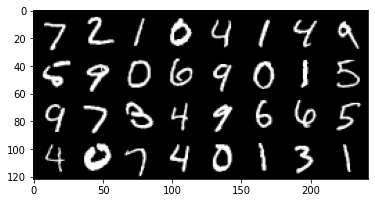

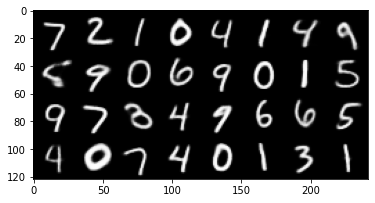

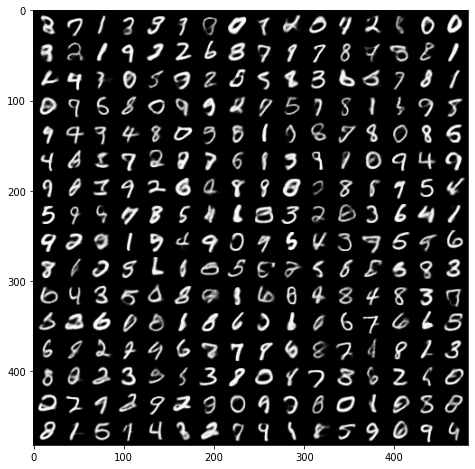

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch,_,_ =model(fixed_input.to(device)) 

    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.fc2(z).view(-1, out_channels*16, 1, 1) #change the second argument to 128 if you use 128 latent dimension
    
    # DECODE
    samples = model.convolution_dec(samples)
    # samples = model.convolutional_decoder(samples)


    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

#### Plots of reconstructed and generated images
N.B.These images have been displayed to aid the explainations below

##### Reconstructed images for varying $\beta$

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/reconstructed_images.png" alt="Hello" width="600" height="800"/>


##### Generated images for varying $\beta$

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/generated_images.png" alt="Hello" width="1000" height="1600"/>



**YOUR ANSWER**

As stated above, the loss function is defined as follows:
$$\mathcal{L} = \mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$



It was observed that the total loss decreased over the training period for both training and validation. This behavior is desirable since the model is trying to minimize the total loss. When analyzing both, the reconstruction loss and KL divergence loss, the following was observed: 

(1) The reconstruction loss term $\textbf{E}_{z\sim q_{\phi}(z|x^{(i)})}[\log{p_{\theta}(x^{(i)}|z)}] $, decreased (across all beta values) which is desirable as the model is trying to minimize the reconstruction loss and (2) the KL loss ,$ D_{KL}[q_{\phi}(z | x^{(i)})||p_{\theta}(z)]$ , increases and converges for all $\beta$ values which is also desirable as  very low values of KL is a sign of posterior collapse,  EXCEPT for a $\beta$ values 10 and 100. In this case the KL decreased as apposed to increased. This is a sign of posterior collapse which will be explained below.

From varying $\beta$ values, I gained better understanding of what are the desirable undesirable behaviors in VAE's. To demonstrate my understanding I will explain the behavior of the loss terms for different $\beta$ values. I will focus on the 2 extreme cases where $\beta$=0 and $\beta$=100 as well as $\beta$=1.

* $\beta$=0

When  $\beta$=0, the KL term does not contribute the overall loss function. In this case, the VAE is only focused on minimizing the reconstruction error, and the encoder network is not incentivized to produce a posterior distribution that accurately represents the true posterior over the latent variables. The log-likelihood decreases and this behavior is desired, however this configuration forces the model to focus only on  reconstructing images as accurate as possible which results in extremely distorted generated images being produced from the latent space. This is because the model is not incentivized to learn independent latent features and therefore the latent space is not disentangled. Hence, overall the model is undesirable . This can be seen in the above generated images, where the reconstructed images very closly match the input images but the generated images are very distorted.

For the other extreme case:
* $\beta$=100

In this scenario, the was a decrease in both the reconstruction loss and KL loss. This is not ideal behavior because the KL loss starts off very low and decreases lower. This is a sign of posterior collapse, which will be explained below. The reconstruction loss here, although it decreases, it is still relatively high. This is due to the high weighting placed on the KL loss term. This behaviour is because the reconstructed images are poorly produced since the model focuses more on the generated images and thus causes the posterior to be equivalent to the prior (which is poorly constructed). The reconstructed training images and generated images looks the extremely similar (if not the same) in this case, which is expected due to the model focusing on generating images as similar as possible to the reconstructed images. This is undesirable behavior.

* $\beta$=1

In this scenario the reconstruction loss decreases while the KL loss increases. Having a $\beta$=1 allows the model to reach a trade off between the reconstruction loss and KL loss and ultimately helps achieve disentanglement (not too much and not too little). This behavior is desirable since it prevents posterior collapse while learning independent latent features.  The reconstructed images and generated images for $\beta$=1 shows sufficent disentanglement and the model is able to produce realistic images.

* Posterio collapse

Posterior collapse in Variational Autoencoders (VAEs) refers to a phenomenon where the latent variables, which are supposed to capture the essential features of the input data, become uninformative and essentially useless for generating new samples. In posterior collapse, the VAE model becomes too reliant on the decoder network and the latent variables lose their ability to capture the relevant information from the input data. Posterior collapse occurs when the KL loss is very low (close to zero). It is most evident in the  $\beta$=100 case and may also be evident for other $\beta$ values where the KL loss starts off very low. The way to combat this is to lower the $\beta$ value attached to the KL loss. Visually, for  $\beta$=100, the generated images are extremely blur and are extremely similar to the reconstructed blurred images. This is a sign of posterior collapse. 


* Understanding why KL divergence increases

The KL term tends to increase in magnitude as the beta value decreases. This happens because the encoder network is less constrained by the KL term and is more likely to produce a posterior distribution that differs significantly from the prior distribution. This can lead to a situation where the VAE generates samples that are highly realistic but may not be sufficiently diverse or may not capture the full complexity of the input data. 




---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
# Interactive Visualization - Code Provided
import seaborn as sns
from matplotlib import offsetbox
from sklearn.manifold import TSNE
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
data = ((loader_test.dataset.data).view(-1, 1, 28, 28)).float() / 255

sample_mu, sample_log_var = model.encode(data.to(device))
sample = model.reparametrize(sample_mu, sample_log_var).cpu()

perplexity=50
with torch.no_grad():
    tsne_cal = TSNE(n_components = 2, verbose = 0, perplexity = perplexity, n_iter = 500)
    z_embedded = tsne_cal.fit_transform(sample.detach().numpy())


plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


alt.HConcatChart(...)

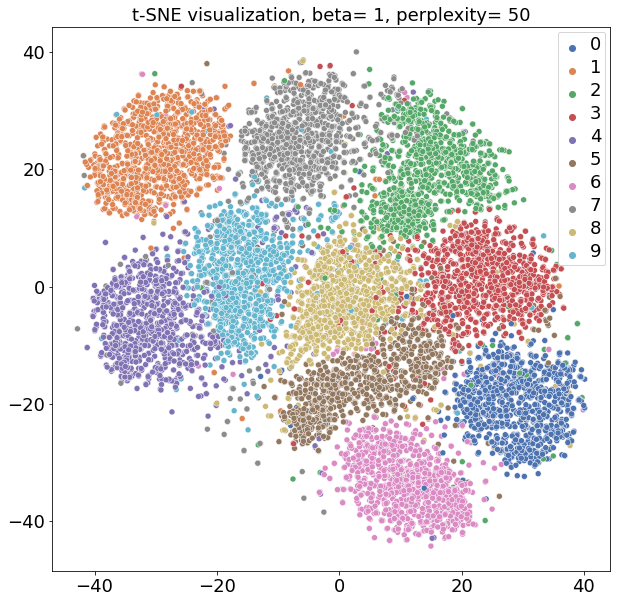

In [ ]:
# Custom Visualizations
x=z_embedded[:, 0]
y = z_embedded[:, 1]

# Plot. 
#Add a title and labels
plt.figure(figsize=(10,10))
scatter_plot =sns.scatterplot(
    x = x, y = y,
    hue = loader_test.dataset.targets,
    palette = sns.color_palette("deep", 10),
    legend="full")
scatter_plot.set_title(f"t-SNE visualization, beta= {beta}, perplexity= {perplexity}",fontsize='18')
plt.setp(scatter_plot.get_legend().get_texts(), fontsize='18') 
scatter_plot.tick_params(labelsize=18)

plt.show()

## Plots of T-SNE visuals for varying $\beta$'s [0,1,100] and varying perplexity [2,50]

#### Plots of T-SNE visuals for varying $\beta$ values and perplexity=50


<img src="https://raw.githubusercontent.com/Joshan9804/images/main/tNSE_perplexity=50.png" alt="Hello" width="1000" height="400"/>


<img src="https://raw.githubusercontent.com/Joshan9804/images/main/tNSE_perplexity=2.png" alt="Hello" width="1000" height="400"/>


### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)


**YOUR ANSWER**

* Role of KL loss on $\beta$

Overall, my observations (for perplexity=50) can be summarized as follows:

As $\beta$ increases, the boundary layers become closer, outliers are more difficult to identify and clusters become less prominent. Similiarly, the opposite holds true as $\beta$ decreases. As $\beta$ increases the KL loss decreases and the T-SNE plot becomes more uniform. This is because the KL loss term is weighted more heavily for greater $\beta$ values which causes the encoder network to be more constrained to produce a posterior distribution that is similar to the prior distribution. This results in the latent space being more uniform which is reflected in the uniformity of the T-SNE plot. This is undesirable behavior in cases where uniformity is an extreme. See below for detailed explainations

I observed that when $\beta$=100, there was no clustering of digits. As mentioned above, for $\beta$=100, there is posterior collapse. When posterior collapse occurs $z$ is independant of $x$ in $ D_{K L}[q_\phi(z \mid x) \| p_\theta(z)]$ (see https://arxiv.org/pdf/1711.05411.pdf for more details), and thus the decoder no longer makes meaningful representations of the latent samples. During training, the $q_\phi$ distribution will try to match the prior but the prior will no longer depend on $x$, and when $x$ is ignored, there is no way to get good reconstructions becausse the encodings no longer depends on $x$. This behavior is justified by viewing the T-SNE plot for $\beta$=100 which shows the images are extremely uniform in the 2-dimensional space (no clustering, outliers and boundaries clearly distinguishable). 

Similarly, I observed that for lower $\beta$ values ($\beta$=1 and $\beta$=0), the degree of unformity decreased, clustering and outlier identification were more identifiable. This behavior occurs because there is less pressure on the latent features to be independent. However keeping in mind that too less pressure (i.e. $\beta$=0) will result in the model not learning independent latent features and thus the latent space will not be disentangled. This is evident in the T-SNE plot for $\beta$=0, where there are large distances between the boundary layer of clusters. The issue in this scenario ($\beta$=0) is that this will result in poor interpolation due to the model not sufficently capturing independent latent features and thus there are poor generalisation between the images. This will result in entanglement. The problem with $\beta$=0, is that the model only trains with regards to reconstruction error, which means the model rarely sees how to generate images from the high density region. The KL term tries to regulate thee spread and location of the embeddings to make sure that it actually overlaps with the high density region. Therefore it is important to have a KL term in the loss function. Hence, a $\beta$=1 is more favorable since there is sufficent disentanglement.


* Is T-SNE reliable?

I do not believe that the T-SNE is sufficently reliable. Reason being, the T-SNE plot is highly sensitive to the parameters. For example, changing the perplexity from 50 to 2 resulted in a different distribution of samples. This occurs because T-SNE is a non-linear dimensionality reduction technique and is highly sensitive to parameters. This is evident in the T-SNE plot for $\beta$=0 and perplexity =50, where the image clusters and boundaries are extremely prominent, but when changing the perplexity =2 for the same $\beta$=0 , the boundaries become alot closer and thus a different conclusion can potentially be observed.  T-SNE plots can be a useful tool for visualizing the performance of a VAE, but should be used in conjunction with other methods and careful interpretation because t-sne plots can distort the distances between data points, which can make it difficult to interpret the distances between clusters. It is often better to use other methods such as PCA or UMAP for a more accurate representation of the data.
Although from a hyperparameter tuning perspective, I find t-SNE unreliable, there are several benefits of using t-SNE. Such benefits include is ability to preserve certain geometric properties of the original data. These include preservation of local structures in the latent space and since t-SNE is a non-linear technique, it can capture the non-linear relationship between datapoints.



## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


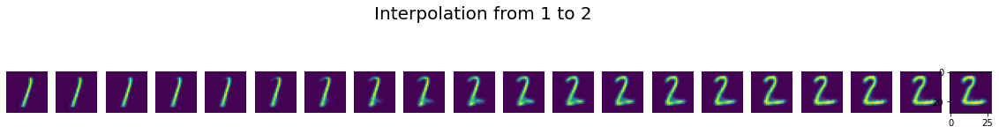

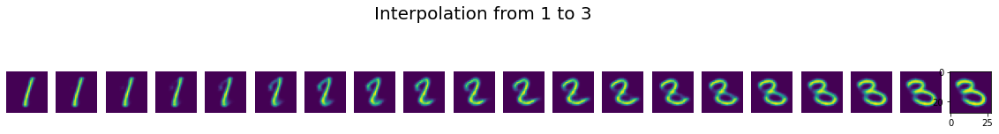

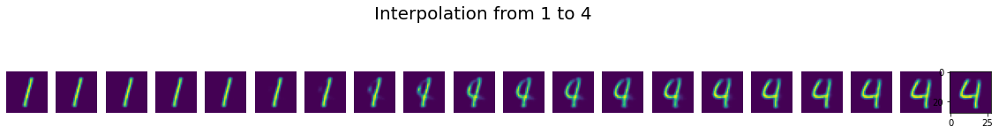

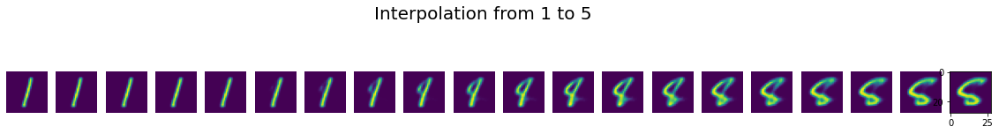

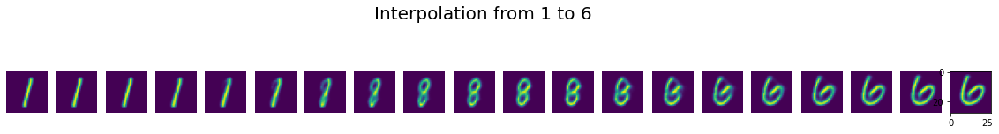

...

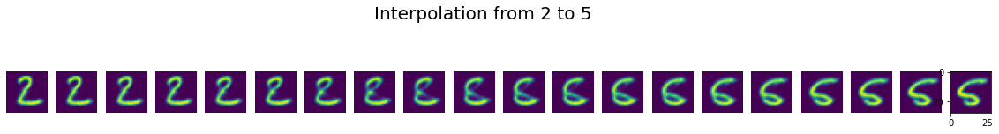

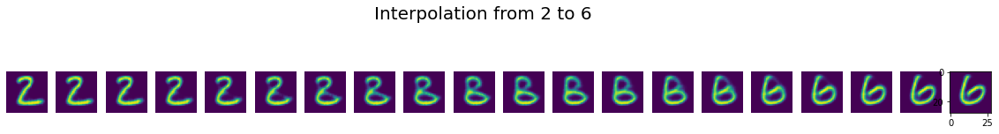

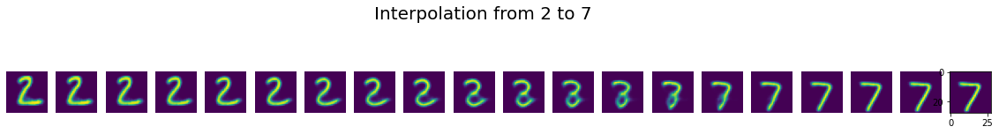

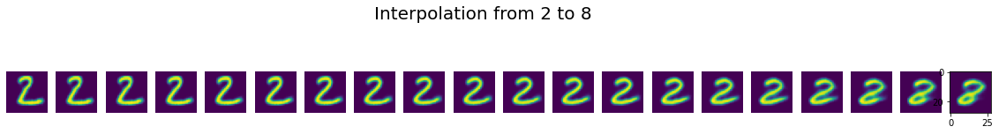

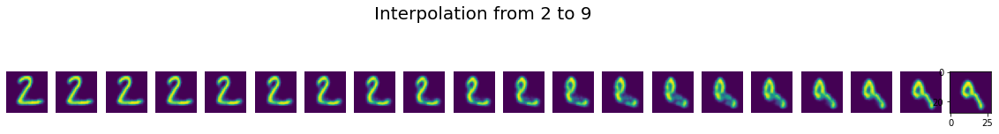

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
import torch

#load the test set
test_data = ((loader_test.dataset.data).view(-1, 1, 28, 28)).float() / 255
y_targets = loader_test.dataset.targets

def linear_interpolate(idx1, idx2, n_steps=10):
    """Linearly interpolate between two vectors x and y.
    Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set.
    Locate the positions in latent space of 2 data points (maybe a one and an eight)
    Args:
        idx1 (torch.Tensor): First vector.
        idx2 (torch.Tensor): Second vector.
        n_steps (int): Number of interpolation steps between x and y.

    """
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    # interpolate between x and y
    digit_1=torch.sum(y_targets==idx1)
    digit_2=torch.sum(y_targets==idx2)

    # Obtain the references and targets
    input_num=test_data[y_targets==idx1][:min(digit_1,digit_2)].to(device)
    target_num=test_data[y_targets==idx2][:min(digit_1,digit_2)].to(device)

    # Get input_num and target reference
    input_sample_mu, input_sample_log_var = model.encode(input_num)
    input_sample = model.reparametrize(input_sample_mu, input_sample_log_var)
    input_sample = model.fc2(input_sample).view(-1, out_channels*16, 1, 1).cpu()

    target_sample_mu, target_sample_log_var = model.encode(target_num)
    target_sample = model.reparametrize(target_sample_mu, target_sample_log_var)
    target_sample = model.fc2(target_sample).view(-1, out_channels*16, 1, 1).cpu()
    
    # Interpolate between the two and store the results in a list
    interpolated_val = []
    for i in range(n_steps):
        ans=input_sample*(n_steps-i)/n_steps+target_sample*i/n_steps
        interpolated_val.append(ans)
    

    interpolated_rec=[]
    for val in interpolated_val:
        output = model.decode(val.to(device))
        output = torch.mean(output, dim=1, keepdim=True) # Convert to grayscale
        interpolated_rec.append(output)
    interpolated_rec = torch.stack(interpolated_rec)

    # Plot the results
    interpolated_rec = interpolated_rec.cpu()
    input_num = input_num.cpu()
    target_num = target_num.cpu()
    


    plt.figure(figsize=(n_steps, 5))
    plt.suptitle('Interpolation from ' + str(idx1) + ' to ' + str(idx2), fontsize=20)
    for idx, reconstructed in enumerate(interpolated_rec.detach().numpy()):
        
        plt.axis('off')
        plt.subplot(2,n_steps, idx + 1)
        
        plt.imshow(reconstructed[0][0])
    plt.show()
  

    #######################################################################
    #                       ** END OF YOUR CODE **
    #######################################################################

interpolated = linear_interpolate(1, 2, n_steps=20)
interpolated = linear_interpolate(1, 3, n_steps=20)
interpolated = linear_interpolate(1, 4, n_steps=20)
interpolated = linear_interpolate(1, 5, n_steps=20)
interpolated = linear_interpolate(1, 6, n_steps=20)
interpolated = linear_interpolate(1, 7, n_steps=20)
interpolated = linear_interpolate(1, 8, n_steps=20)
interpolated = linear_interpolate(1, 9, n_steps=20)
interpolated = linear_interpolate(2, 3, n_steps=20)
interpolated = linear_interpolate(2, 4, n_steps=20)
interpolated = linear_interpolate(2, 5, n_steps=20)
interpolated = linear_interpolate(2, 6, n_steps=20)
interpolated = linear_interpolate(2, 7, n_steps=20)
interpolated = linear_interpolate(2, 8, n_steps=20)
interpolated = linear_interpolate(2, 9, n_steps=20)


### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization


**YOUR ANSWER**

I chose multiple class combinations to better understand the behavior of the model. For some class combinations, the interpolations transitioned from the starting number to the target number, while others interpolations transitioned to a different number first before transitioning to the target number. To analyze this in more detail, I will look at specific interpolations and discuss the behavior of the model.

* Interpolation between 1 and 7:
The transition between class 1 and class 7 is relatively smooth, which indicates that these 2 clusters are close together/neighboring clusters. This is evident in the T-SNE plot which shows that class 1 (orange) and class 7 (grey) are close together/neighboring clusters. Therefore these visual results are expected. This is one of the beneficial properties of t-SNE plots- it has the ability to preserve certain geometric properties. 

* Interpolation between 2 and 5:
I observed that the interpolation between class 2 and class  3 had an intermediate transition- the 2 first forms an 8 and then a 3. When looking at the T-SNE plot, it can be seen that class 2 (green) is not a direct neighboring cluster to class 5 (brown). The T-SNE plot shows that between clusters 2 (green) and 3(red), is cluster 8 (Khaki). Thus, the interpolation results between class 2 and class 5 are expected.

Additionally for lower beta values it is expected that the transition between the 2 numbers to be more abrupt due to poor regularisation of the latent space and entanglement. For larger beta values, it expected that the transition between numbers will be smoother due to disentanglement. 


# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [ ]:
batch_size = 128  

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),
])

#### I trialed data augmentations -> Was not affective

# transform_train_1 = transforms.Compose([
#      transforms.RandomHorizontalFlip(p = 0.5),
#      transforms.ToTensor(),
#      transforms.Normalize(mean=mean, std=std),
# ])
# transform_train_2 = transforms.Compose(

#         [
#             transforms.Resize(32),
#             transforms.CenterCrop(32),
#             transforms.RandomAffine(0, translate=(0, 0.05)),
#             transforms.RandomResizedCrop(32,scale=(0.2,0.75)),
#             transforms.RandomInvert(),
#             transforms.RandomAdjustSharpness(sharpness_factor=2),
#             transforms.ToTensor(),
#             transforms.Normalize(mean.tolist(), std.tolist()),
#         ]
# )

####

# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
# cifar10_train_augment_1=datasets.CIFAR10(data_path, train=True, download=True, transform=transform_train_1)
# cifar10_train_augment_2=datasets.CIFAR10(data_path, train=True, download=True, transform=transform_train_2)
# cifar10_train_augmentations=cifar10_train#+cifar10_train_augment_1#+cifar10_train_augment_2

cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data/
Files already downloaded and verified


We'll visualize a subset of the test set: 

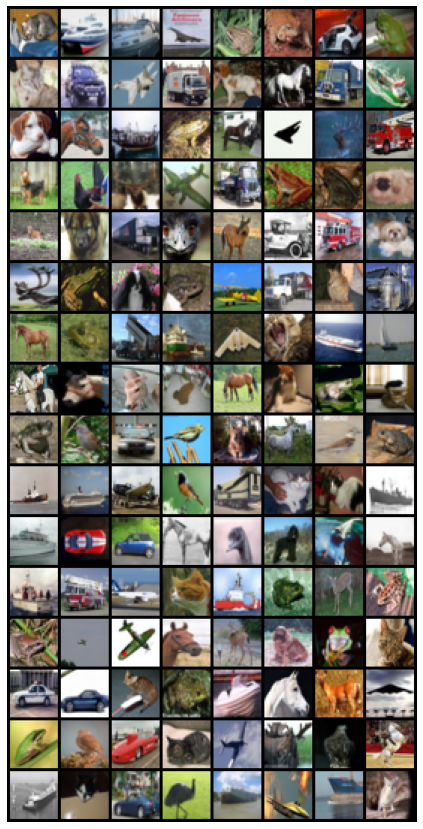

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 80
latent_vector_size = 150 
learning_rate =  4e-04 

# Other hyperparams
img_size_generator = 64
img_size_discriminator = 128
neg_slope = 0.2


In [ ]:
# # *CODE FOR PART 2.1 IN THIS CELL*
# """
# Architecture guidelines for stable Deep Convolutional GANs
# • Replace any pooling layers with strided convolutions (discriminator) and fractional-strided
# convolutions (generator).
# • Use batchnorm in both the generator and the discriminator.
# • Remove fully connected hidden layers for deeper architectures.
# • Use ReLU activation in generator for all layers except for the output, which uses Tanh.
# • Use LeakyReLU activation in the discriminator for all layers

# https://arxiv.org/pdf/1511.06434.pdf


class Generator(nn.Module):
    def __init__(self,latent_vector_size,img_size_generator):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_vector_size=latent_vector_size
        self.img_size_generator=img_size_generator

        self.generator = nn.Sequential(
            nn.ConvTranspose2d(self.latent_vector_size, self.img_size_generator * 8, kernel_size = 4, stride = 1, padding = 0, bias = False),
            nn.BatchNorm2d(self.img_size_generator * 8),            
            nn.ReLU(True),

            nn.ConvTranspose2d(self.img_size_generator * 8, self.img_size_generator * 4, kernel_size = 4, stride = 2,padding = 1, bias=False),
            nn.BatchNorm2d(self.img_size_generator * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(self.img_size_generator * 4,  self.img_size_generator*2, kernel_size = 4, stride = 2,  padding = 1, bias=False),
            nn.BatchNorm2d(self.img_size_generator*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(self.img_size_generator*2,3, kernel_size = 4, stride = 2, padding = 1, bias=False)
            # nn.Tanh()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        out = self.generator(z)
        out = 2*nn.Tanh()(out)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self,neg_slope,img_size_discriminator):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.neg_slope=neg_slope
        self.img_size_discriminator=img_size_discriminator


        self.discriminate = nn.Sequential( nn.Conv2d(3, self.img_size_discriminator, kernel_size = 4, stride = 2, padding= 1, bias = False),
            nn.BatchNorm2d(self.img_size_discriminator),
            nn.LeakyReLU(self.neg_slope, True),
            #nn.Dropout(p=0.3),

            nn.Conv2d(self.img_size_discriminator,self.img_size_discriminator * 2, kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(self.img_size_discriminator * 2),
            nn.LeakyReLU(self.neg_slope, True),
            #nn.Dropout(p=0.3),

            nn.Conv2d(self.img_size_discriminator * 2,self.img_size_discriminator * 4, kernel_size = 4, stride = 2,padding = 1, bias = False),
            nn.BatchNorm2d(self.img_size_discriminator * 4),            
            nn.LeakyReLU(self.neg_slope, True),
            #nn.Dropout(p=0.3),

            nn.Conv2d(self.img_size_discriminator * 4, out_channels = 1, kernel_size = 4, stride = 1, padding = 0, bias = False),
            
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.discriminate(x).view(-1, 1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# # custom weights initialization called on netG and netD
# def weights_init(m):
#     classname = m.__class__.__name__
#     if classname.find('Conv') != -1:
#         m.weight.data.normal_(0.0, 0.02)
#     elif classname.find('BatchNorm') != -1:
#         m.weight.data.normal_(1.0, 0.02)
#         m.bias.data.fill_(0)

# All model weights should be initalized according to the author of the DCGAN paper
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)   

In [ ]:

use_weights_init = True

model_G = Generator(latent_vector_size,img_size_generator).to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator(neg_slope,img_size_discriminator).to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3858176
Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(150, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
)


Total number of parameters in Discriminator is: 2637568
Discriminator(
  (discriminate): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
# You can modify the arguments of this function if needed
criterion = nn.BCELoss(reduction='mean')


def loss_function(out,labels):
    loss = criterion(out, labels)
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
beta2=0.5


optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate / 2, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta2, 0.999))

gamma1 = 0.95
gamma2=0.95
schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size = 1, gamma = gamma1)
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size = 2, gamma = gamma2)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
fake_label = 0.1
real_label = 0.9

#Added label smoothing to add regularisation to the discriminator.

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

Epoch 4: 100%|██████████| 391/391 [00:16<00:00, 23.18batch/s, D_G_z=0.427/0.186, D_x=0.712, Loss_D=1.08, Loss_G=1.62]


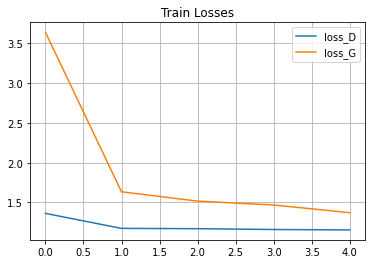

Epoch 9: 100%|██████████| 391/391 [00:17<00:00, 22.90batch/s, D_G_z=0.433/0.257, D_x=0.693, Loss_D=1.09, Loss_G=1.32]


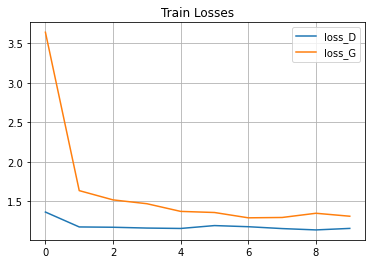

Epoch 14: 100%|██████████| 391/391 [00:16<00:00, 23.09batch/s, D_G_z=0.442/0.313, D_x=0.637, Loss_D=1.17, Loss_G=1.15]


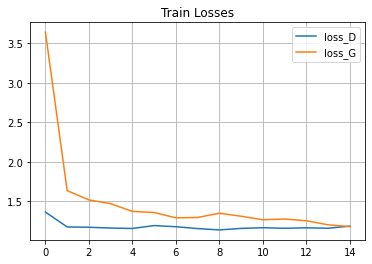

Epoch 19: 100%|██████████| 391/391 [00:17<00:00, 22.99batch/s, D_G_z=0.387/0.319, D_x=0.622, Loss_D=1.11, Loss_G=1.12]


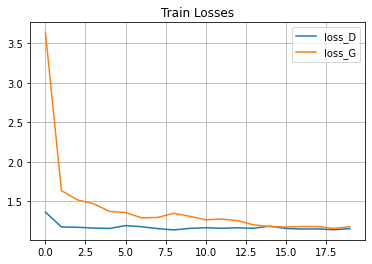

Epoch 24: 100%|██████████| 391/391 [00:17<00:00, 22.72batch/s, D_G_z=0.362/0.335, D_x=0.592, Loss_D=1.11, Loss_G=1.07]


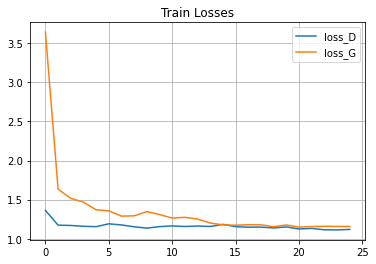

Epoch 29: 100%|██████████| 391/391 [00:17<00:00, 22.80batch/s, D_G_z=0.299/0.382, D_x=0.573, Loss_D=1.07, Loss_G=0.966]


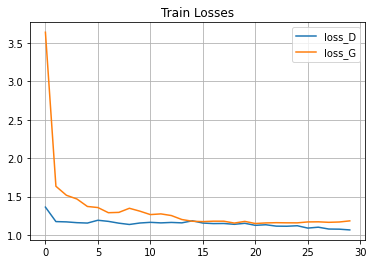

Epoch 34: 100%|██████████| 391/391 [00:17<00:00, 22.80batch/s, D_G_z=0.397/0.347, D_x=0.644, Loss_D=1.09, Loss_G=1.07]


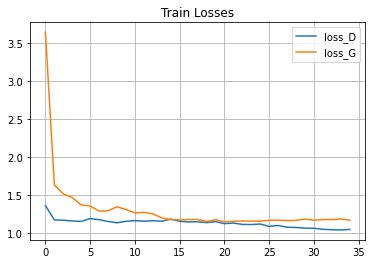

Epoch 39: 100%|██████████| 391/391 [00:17<00:00, 22.86batch/s, D_G_z=0.396/0.305, D_x=0.682, Loss_D=1.05, Loss_G=1.17]


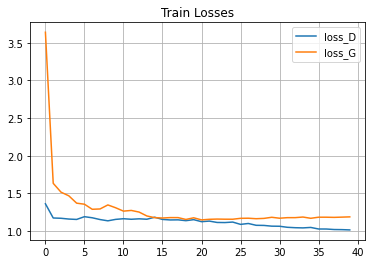

Epoch 44: 100%|██████████| 391/391 [00:17<00:00, 22.76batch/s, D_G_z=0.308/0.307, D_x=0.639, Loss_D=0.995, Loss_G=1.17]


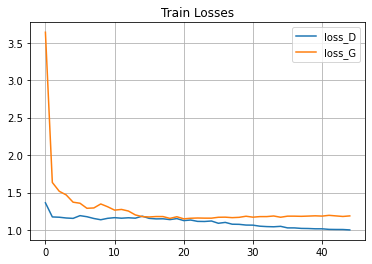

Epoch 49: 100%|██████████| 391/391 [00:17<00:00, 22.81batch/s, D_G_z=0.285/0.327, D_x=0.619, Loss_D=0.994, Loss_G=1.12]


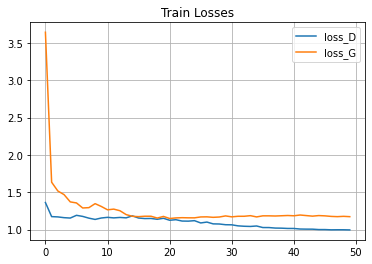

Epoch 54: 100%|██████████| 391/391 [00:17<00:00, 22.90batch/s, D_G_z=0.330/0.313, D_x=0.662, Loss_D=0.991, Loss_G=1.16]


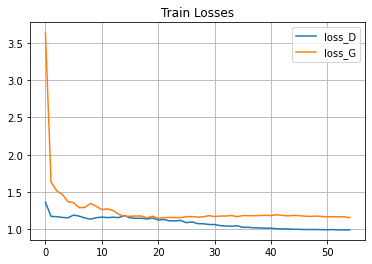

Epoch 59: 100%|██████████| 391/391 [00:17<00:00, 22.94batch/s, D_G_z=0.313/0.322, D_x=0.656, Loss_D=0.982, Loss_G=1.13]


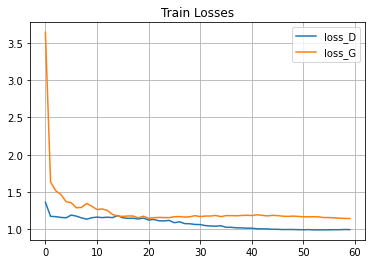

Epoch 64: 100%|██████████| 391/391 [00:17<00:00, 22.84batch/s, D_G_z=0.335/0.336, D_x=0.654, Loss_D=1, Loss_G=1.09]


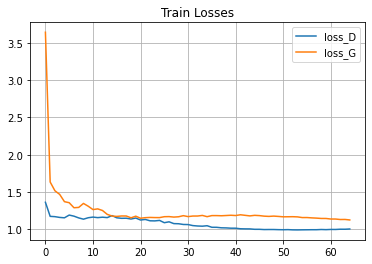

Epoch 69: 100%|██████████| 391/391 [00:17<00:00, 22.84batch/s, D_G_z=0.365/0.344, D_x=0.65, Loss_D=1.05, Loss_G=1.08]


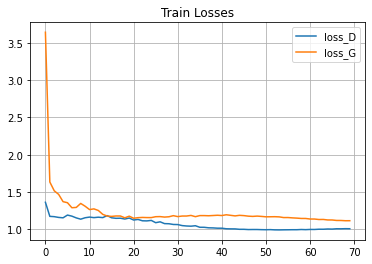

Epoch 74: 100%|██████████| 391/391 [00:17<00:00, 22.72batch/s, D_G_z=0.356/0.354, D_x=0.641, Loss_D=1.05, Loss_G=1.07]


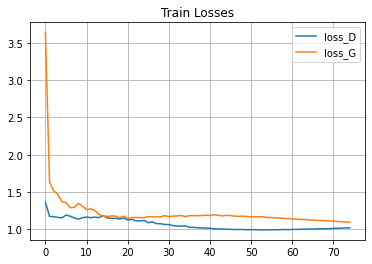

Epoch 79: 100%|██████████| 391/391 [00:17<00:00, 22.83batch/s, D_G_z=0.347/0.345, D_x=0.641, Loss_D=1.03, Loss_G=1.07]


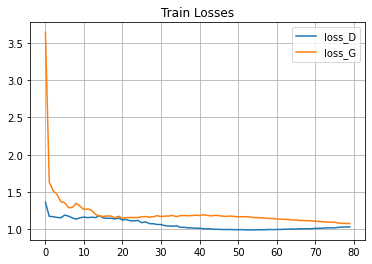

In [ ]:
train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    # <- You may wish to add logging info here


    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        train_loss_D = 0
        train_loss_G = 0
        for i, data in enumerate(tepoch):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################device

            ## Train with the real
            model_D.zero_grad()
            
            # Process the labels.
            real_cpu = data[0].to(device)
            batch_size = real_cpu.size(0)
            label = torch.full((batch_size,), real_label, device=device).type(torch.FloatTensor).to(device)

            # Obtain the output for the discriminator.
            D_out = model_D(real_cpu)


            # Calcualate the discriminator error.
            realD_err = loss_function(D_out, label)
            realD_err.backward()
            
            #D(x)
            D_x = D_out.mean().item()

            fake_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)

            # Obtain generator output
            G_out = model_G(fake_noise)
            label = torch.full((batch_size,), fake_label, device=device).type(torch.FloatTensor).to(device)

            # Run the fake data through the discriminator
            DG_out = model_D(G_out.detach())

            # Disciminator Error.
            fakeD_err = loss_function(DG_out, label)
            fakeD_err.backward()
            
            # D(G(z1))
            D_G_z1 = DG_out.mean().item()

            # Get the error logs
            errD = realD_err + fakeD_err
            train_loss_D += errD.item()

            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            model_G.zero_grad()

            # Prepocess the real labels
            label = torch.full((batch_size,), real_label, device=device).type(torch.FloatTensor).to(device)

            DG_out = model_D(G_out)

            # Calculate error on generator.
            errG = loss_function(DG_out, label)
            errG.backward()

            #D(G(z2)) 
            D_G_z2 = DG_out.mean().item()

            # Get the error logs
            train_loss_G += errG.item()

            optimizerG.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    if epoch % 10 == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), content_path/f'CW_GAN/fake_samples_epoch_{epoch}_03d.png')
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))


    schedulerD.step()
    schedulerG.step()

    if (epoch + 1) % 5 == 0:
        plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
        plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
        plt.legend()
        plt.title('Train Losses')
        plt.grid()
        plt.show()
    

# If your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

# # Also save the models in a more standard way
# torch.save(model_G.state_dict(), content_path/'CW_GAN/GAN_G_model.pth')
# torch.save(model_D.state_dict(), content_path/'CW_GAN/GAN_D_model.pth')


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

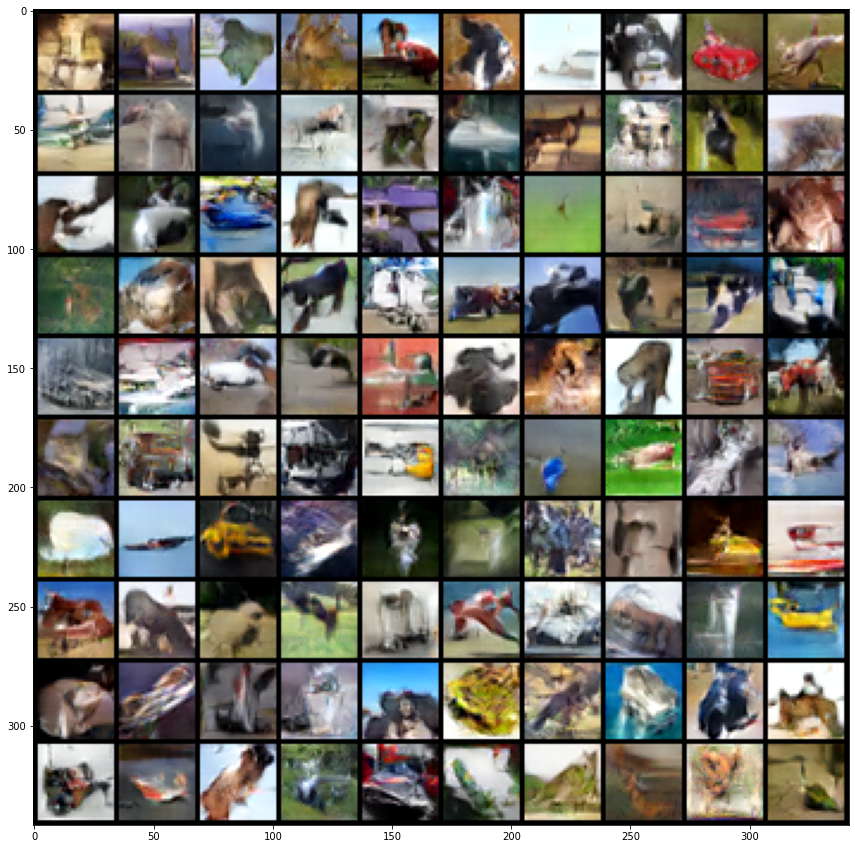

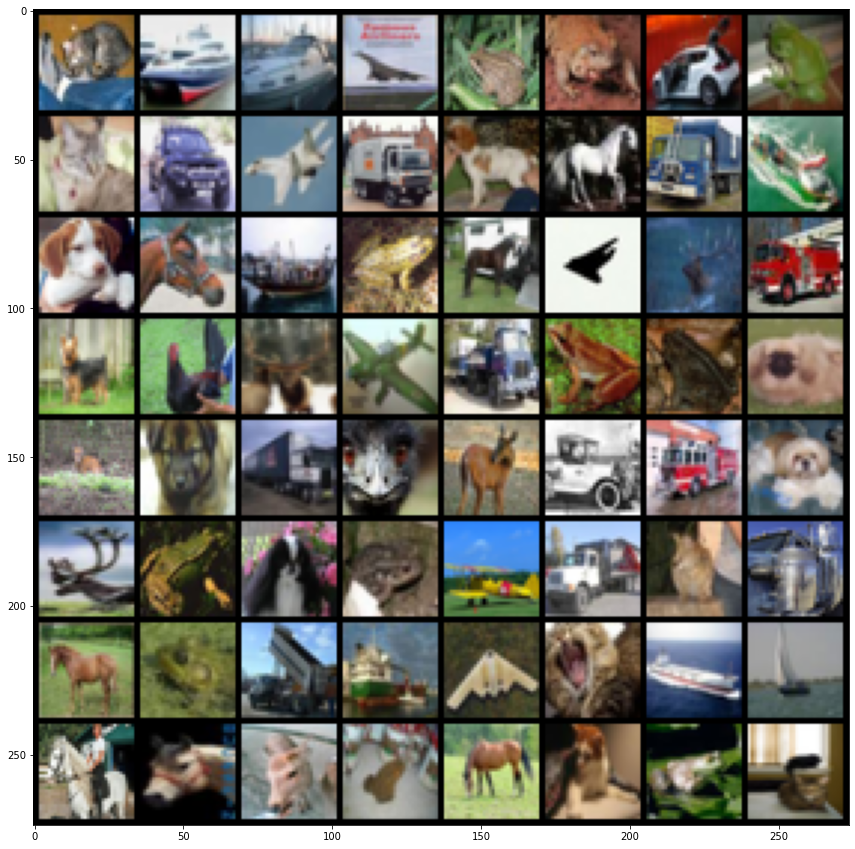

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

# Gif Visualization

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/7d2rtz.gif" alt="Hello" width="300" height="500"/>



## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**



* Although the images from my final trained model may not be the best-I unfortunately went crazy trying to get it to level 3 but failed :( , I did successfully stabilize the model training and achieved convergence in my loss function. From conducting literature research, my final architecture was inspired by the DCGAN paper [link text](https://arxiv.org/pdf/1511.06434.pdf).

This architecture consists of 4 convolutional layers in the generator. Each convolutional layer is followed Batch normalization and Relu's except for the last layer which consists of a TanH activation. This tanH function is multiplied by 2 to combat the blurry image outputs.   

The discriminator also has 4 layers followed by batch normalization and Leaky relu's except for the last layer which has a sigmoid activation. Using this architecture, significantly improved the stability of training. 


* **Emperical Methods utilized**:


I started by applying the techniques mentioned in the above first paragraph which follows the architecture suggested by S. Chintala (2016) [link text](https://arxiv.org/pdf/1511.06434.pdf) and achieved relatively stable results however my loss of my generator did not decrease. This was due to my hyperparameters not being tuned. Once I achieved this relatively stable network, I then went on to improve the network by varying several parameters and hyperparameters to improve training and loss convergence. I did not encounter mode collapse using this network architecture and once my hyperparameters was tuned.

* **What didnt work, what worked and what mattered the most**.

1. *Increasing learnable parameters (increase complexity of network)* did not work: The paper by S. Chintala (2016) uses a very complex network with over 23 million trainable parameters. My generator loss did not decrease for this network since it was very complex, and had a very high number of trainable parameters. I  decreased the channel sizes to reduce the model complexity. This did help reduce the loss I was getting in my generator (see plots below for loss graph of this network). I started off by reducing my learnable parameters to approximately 1.5 million parameters and slowly increased this value while ensuring that as I increased the models complexity,  training remained stable. My best architecture has approx. 6.5 million parameters. Model architectures close to the max limit of 25 million did not work well because these networks are too complex.  

2. *Batch Normalization* in each convolutional layer in both the generator and discriminator helped improve stability. I applied this based of the literature reading by S. Chintala (2016). I removed the batchnorm layers to better understand how it may affect my model stability. I observed that my loss had a high variance and my generator loss increased. The reason why Batch normalization improves stability of the GAN network is, by normalizes the input to each unit of a layer, it helps to deal with poor initialization that may cause problems in gradient flow. 

3. *Relu activations* for the generator and *Leaky relu's* for the discriminator also helped stabilize training. A regular ReLU function works by truncating negative values to 0. This has the effect of blocking the gradients to flow through the network. Therefore in the discriminator, instead of the function being zero, leaky RELUs allow a small negative value to pass through. Leaky relu's are better suited in the discriminator because using Relu units will always output 0's for negative values which severely affects gradient flow. It is important to ensure gradient flow since the only way the generator learns is by recieving the gradients from the discriminator. Leky relu's help solve the 'dying' relu problem.




4. *Increasing the number of layers* did not improve training for my network. The loss function did not stabilize and it did not decrease when I added more layers. I assume this is because by adding more layers, I am making the network more complex and I have already established that a too complex network is not good.

5. *Increasing the training dataset through data augmentation* did not work well. In theory, data augmentation is expected to improve model performance since more data is provided to the model for learning. However, when I added random horizontal and vertical flips to my training images, my network took longer to train, which is expected, but I saw no difference in the output image quality.

6. *Label smoothing* did work relatively well. Initially, the real and fake images were set to 1 and 0 respectively. I applied label smoothing by setting the real and fake images to 0.9 and 0.1 respectively.  Label smoothing improved  my model by adding regularisation to the discriminator and prevented overfitting. My discriminator was extremely powerful at the start of training which meant My generator was not learning efficently. By implementing label smoothing, it made it more difficult for the discriminator to distinguish between real and fake images. This then allowed the generator to learn to produce more realistic images and achieve its objective of fooling the discriminator (T. Salimans et al,2016 [link text](https://https://arxiv.org/pdf/1606.03498.pdf))

7. *Drop outs*  did not make any material difference to my network. While in theory, dropouts does help prevent overfitting, Srivastava, et al. (2014), the use of batch normalization is sufficent. As mentioned in the lectures (lecture 7 on batch normalisation) by Bernhard Kainz, batch normalization is performing regularisation by noise injection. Therefore in most cases, there is no need for drop out layers since both batch norms and drop outs perform capacity control.

* What worked the most for me was reducing the number of parameters, having a tuned learning rate and label smoothing

* **Tricks came across in the literature etc.**
1. I was able to track failures early by identifying when the D_loss goes to zero. This essentially meant that the Discriminator was too good at identifying real and fake images which meant the generator will not be learning anything.

2. Visualizations of the loss curve after every 5 epochs helped me identify anomalies sooner and saved me the time of running through the entire training cycle.

3. Implementing a learning rate scheduler for both the generator and discriminator did improve my model stability and convergence. In my initial design, although learning was relatively stable, my discriminator was still quiet powerful and this severely affected my generators learning. By setting a step=1 and gamma=0.95 for my discriminator scheduler, the networks learning improved. 





* **Concluding remarks**

Implementing the architecture by S. Chintala (2016) [link text](https://arxiv.org/pdf/1511.06434.pdf) as my base model did significantly reduce the amount of engineering changes needed to reach stability. However hyperparameter tuning did take significantly long (60+hrs). I do however believe the network can be further improved. This can be done by implementing the tricks suggested by T Salimans et al (2016) [link text](https://https://arxiv.org/pdf/1606.03498.pdf):

* Implementing GAN feature matching. This is a regularizing objective for the generator that prevents it from overtraining on the current discriminator. Instead of directly maximizing the output of the discriminator, the new objective requires the generator to generate data that matches the statistics of the real data, where we use the discriminator only to specify the statistics that we think are worth matching.

* Minibatch discrimination. This helps prevent mode collapse. This method is able to achieve this by enhancing the diversity of the generated samples by introducing additional information about the other samples in the mini-batch.

* Historical averaging. The basic idea behind historical averaging is to use an exponentially weighted moving average of the generator weights during training, instead of the current generator weights. This involves maintaining a separate set of "average" weights for the generator, and updating them at each iteration of the training process.

* Improving hyperparameters. Most of the hyperparameters were chosen emperically which was the most time consuming aspect of this project.

* Using Conditional GANS- A conditional GAN (cGAN) operates differently from a regular GAN in that the discriminator is presented with both data and label pairs instead of just data, while the generator is provided with a label and noise vector to indicate the desired image class. By including labels, the generator is able to develop diverse representations of various classes within the training data, allowing for more precise control of the generated output. Typically, during model training, the label is incorporated into the data sample for both the generator and discriminator. Conditional GANS are known to have more stable training, however my current architecture and hyperparameter achieves stable.

Unfortunately, my network could only achieve a level 2 image quality level :(

By implementing the above methods, I believe level 3 can be achieved. (Please be kind with marking I tried really hard to get to level 3 but failed)






### The Below cells  shows some of the various different emperical experiments ran inorder to obtain the best possible model.

Please note that I did not save the results for "every" experiment I ran and did not include all experiments in my main notebook. This was done to prevent my main notebook from becoming too long and confusing (and difficult to mark). So I provide images of the "Some" of the experimental results which I had saved for the various configurations and engineeering modifications in backed up notebook versions.

______________________________________________________________________________
## Start of experimental results

1. Large complex network results

The below architecture consists of 24.8 million parameters. This is the base results I started with. This network produced relatively stable learning since the loss function variance/oscillatory motion reduced after 20 epochs. However, the loss did not go down after40 epochs which suggested to me that the network is too complex. I combated this by reducing the number of learnable parameters

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/large_network_architecture.png" alt="Hello" width="500" height="500"/>

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/large_network_loss.png" alt="Hello" width="3000" height="300"/>


2. Smaller network. 

The difference in the loss between generator and discriminator decreased for a less complex network. The increased osscialatory behavior indicated to me that the learning rate needed tuning as well as the addition of a learning rate scheduler. 


<img src="https://raw.githubusercontent.com/Joshan9804/images/main/Smaller network_architecture.png" alt="Hello" width="500" height="500"/>

<img src="https://raw.githubusercontent.com/Joshan9804/images/main/Smaller network_loss.png" alt="Hello" width="1000" height="300"/>

* I then further experimented with:
1. Number of layers
2. Number of parameters (decreased)
3. Drop out layers
4. Learning rates
5. Schedulers.
6. Label smoothing etc. 
 
 (however i do not have the saved results all of these experiments and due to time constraints i could rerun these experiments, because I had other courseworks to complete unfortunately
 )


3. Implementing a WGAN

I tried implementing WGAN since from searching online and reading the WGAN paper (https://arxiv.org/pdf/1701.07875.pdf). The research paper and many other online resources suggested that WGANS is much more stable than DCGANS. Although I did stablize my DCGAN, I wanted to try implementing WGANS The changes I made to the DCGAN architecture are as follows,

* I removed the Sigmoid activation from the last layer of the discriminator, since the output of the discriminator should not be constrained to the range [0, 1] as in a standard GAN.
* I added a call to squeeze() to the output of the discriminator to ensure that it returns a 1-dimensional tensor, which is the expected output for a WGAN discriminator.


* I used the following github WGAN repository as a guide to create a WGAN (https://github.com/Zeleni9/pytorch-wgan) and the WGAN paper [link text](https://https://arxiv.org/pdf/1701.07875.pdf).


* When creating the losss function, the binary cross entropy loss used in DCGANS was replaced by the Wasserstein loss function . This is a type of mean-squared error loss that encourages the discriminator to output scores that are close to the true data distribution for real data, and far away from the true data distribution for fake data. 

* The discriminator's weights are clipped to a small range to prevent the discriminator from becoming too powerful. I used a weight_cliping_limit = 0.01.

* I used a lambda_gp value of 10 as stated in the WGAN paper. This hyperparameter controls the weight of the gradient penalty term added to the discriminator loss. The gradient penalty term is used to enforce the Lipschitz constraint on the discriminator function, which helps to improve the stability of the training process and avoid mode collapse.

* Lastly I trained the discriminator more often than the generator.

Following all these steps, I UNFORTUNATELY could not get my WGAN to work due to time constraints (spent +12 hrs reading up on WGANS and trying to implement) and Paperspace GPU capacity limits continously being reached which prevented me from figuring out where I am going wrong. I did include my code implementation as proof that I did try the WGAN implementation and explained the steps I followed in attempting to successfully implement a WGAN. Although my WGAN was not a successful implementation, I expect a successful WGAN will require less tuning to achieve stable learning and relatively resalistic images. 


Total number of parameters in Generator is: 5652867
Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(100, 576, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(576, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(576, 384, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(384, 192, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(192, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2119937
Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(3, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, ep

Epoch 4: 100%|██████████| 391/391 [00:28<00:00, 13.85batch/s, D_G_z=0.0356, D_x=-.00561, Loss_D=3.99, Loss_G=-.0356]


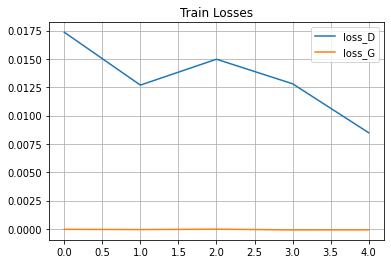

Epoch 9: 100%|██████████| 391/391 [00:28<00:00, 13.71batch/s, D_G_z=0.0335, D_x=0.00153, Loss_D=3.92, Loss_G=-.0335]


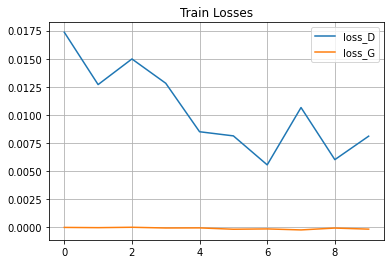

Epoch 14: 100%|██████████| 391/391 [00:28<00:00, 13.71batch/s, D_G_z=0.101, D_x=-.00024, Loss_D=1.28, Loss_G=-.101]


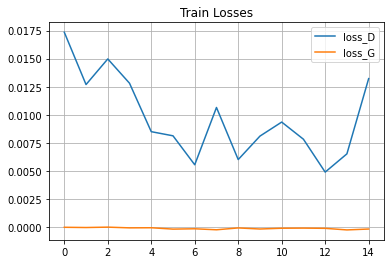

Epoch 19: 100%|██████████| 391/391 [00:28<00:00, 13.75batch/s, D_G_z=0.111, D_x=-.00154, Loss_D=1.82, Loss_G=-.111]


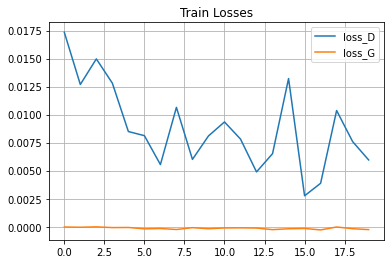

Epoch 24: 100%|██████████| 391/391 [00:28<00:00, 13.64batch/s, D_G_z=0.13, D_x=0.00517, Loss_D=1.94, Loss_G=-.13]


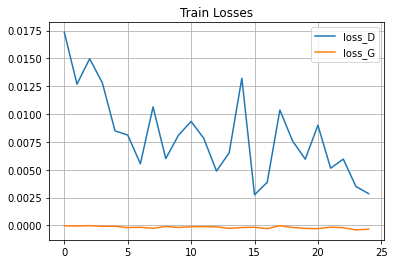

Epoch 29: 100%|██████████| 391/391 [00:28<00:00, 13.80batch/s, D_G_z=0.0939, D_x=0.00485, Loss_D=2.36, Loss_G=-.0939]


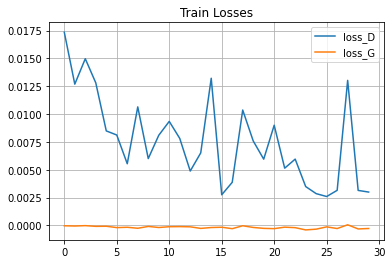

Epoch 34: 100%|██████████| 391/391 [00:28<00:00, 13.90batch/s, D_G_z=0.0388, D_x=0.00203, Loss_D=1.58, Loss_G=-.0388]


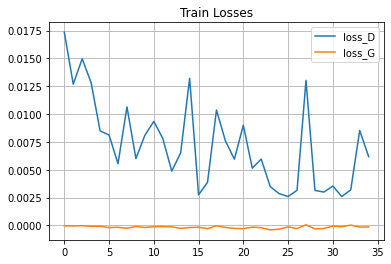

Epoch 39: 100%|██████████| 391/391 [00:28<00:00, 13.84batch/s, D_G_z=0.0694, D_x=0.0115, Loss_D=2.93, Loss_G=-.0694]


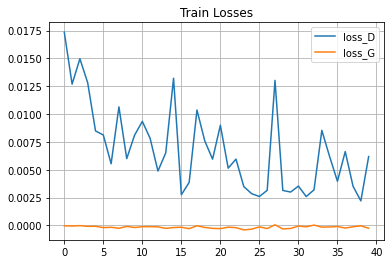

In [ ]:
## Experimenting with WGANS
num_epochs = 40
latent_vector_size = 100 #originally set at 32
learning_rate =  4e-04 

# Other hyperparams
img_size_generator = 96
img_size_discriminator = 96
channels = 3
neg_slope = 0.2

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.generator = nn.Sequential(
            nn.ConvTranspose2d(in_channels=latent_vector_size, out_channels=img_size_generator*6, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(num_features=img_size_generator*6),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=img_size_generator*6, out_channels=img_size_generator*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=img_size_generator*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=img_size_generator*4, out_channels=img_size_generator*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=img_size_generator*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=img_size_generator*2, out_channels=channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.generator(z)
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.discriminator = nn.Sequential(
            nn.Conv2d(in_channels=channels, out_channels=256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        out = self.discriminator(x)
        return out.squeeze()

#########################################################

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

#########################################################


use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
beta2=0.5

# Discriminator will effectively have a learning rate of value 2e-04
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate / 2, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta2, 0.999))

gamma1 = 0.95
gamma2=0.95
schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size = 1, gamma = gamma1)
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size = 2, gamma = gamma2)


fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
fake_label = 0.1
real_label = 0.9


train_losses_G = []
train_losses_D = []
n_critic = 5
weight_cliping_limit = 0.01
lambda_gp = 10

for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0
          
            ############################
            # (1) Update D network
            ###########################
            model_D.zero_grad()

            # Process the real data
            real_data = data[0].to(device)
            batch_size = real_data.size(0)
            real_out = model_D(real_data)

            # Generate fake data
            fake_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
            fake_data = model_G(fake_noise).detach()
            fake_out = model_D(fake_data)

            # Calculate the gradient penalty
            alpha = torch.rand(batch_size, 1, 1, 1, device=device)
            interpolated = (alpha * real_data + (1 - alpha) * fake_data).requires_grad_(True)
            interpolated_out = model_D(interpolated)
            grad = torch.autograd.grad(outputs=interpolated_out, inputs=interpolated,
                                       grad_outputs=torch.ones(interpolated_out.size(), device=device),
                                       create_graph=True, retain_graph=True, only_inputs=True)[0]
            grad = grad.view(grad.size(0), -1)
            grad_norm = grad.norm(2, dim=1)
            gradient_penalty = ((grad_norm - 1) ** 2).mean()

            # Calculate the discriminator loss
            loss_D = -real_out.mean() + fake_out.mean() + lambda_gp * gradient_penalty
            loss_D.backward()
            train_loss_D += loss_D.item()
            optimizerD.step()
            
            # Clamp the discriminator weights
            for p in model_D.parameters():
                p.data.clamp_(-weight_cliping_limit, weight_cliping_limit)
                
            if i % n_critic == 0:
                ############################
                # (2) Update G network
                ###########################
                model_G.zero_grad()

                # Generate fake data
                fake_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
                fake_data = model_G(fake_noise)
                fake_out = model_D(fake_data)

                # Calculate the generator loss
                loss_G = -fake_out.mean()
                loss_G.backward()
                train_loss_G += loss_G.item()
                optimizerG.step()

            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 


            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_x=real_out.mean().item(), D_G_z=fake_out.mean().item(),
                                  Loss_D=train_loss_D, Loss_G=train_loss_G)

    if epoch % 10 == 0:
        save_image(denorm(real_data.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), content_path/f'CW_GAN/fake_samples_epoch_{epoch}_03d.png')
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))

    schedulerD.step()
    schedulerG.step()

    if (epoch + 1) % 5 == 0:
        plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
        plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
        plt.legend()
        plt.title('Train Losses')
        plt.grid()
        plt.show()



______________________________________________________________________________
## End of experimental results

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

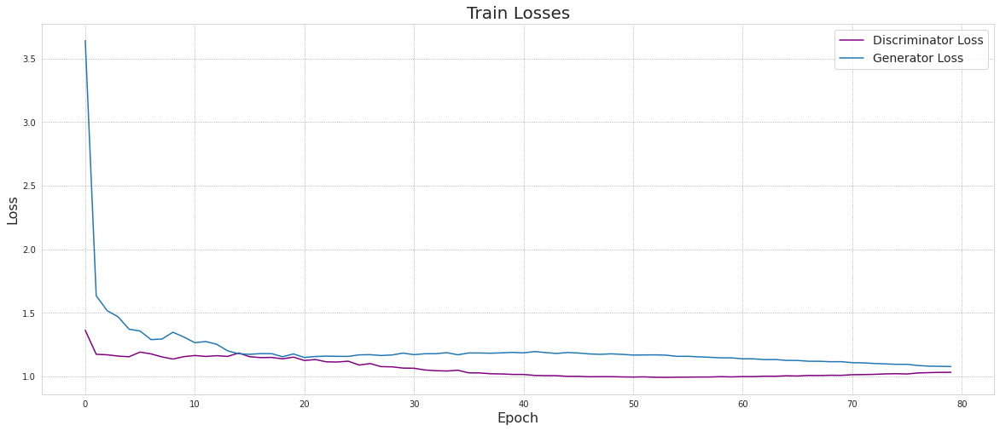

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
# Plot the train_losses_D and train_losses_G for the GAN training process

import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot style
sns.set_style("whitegrid", {"grid.color": ".6", "grid.linestyle": ":"})

# Set the figure size
plt.figure(figsize=(20, 8))

# Plot the data with Seaborn
sns.lineplot(x=list(range(0, np.array(train_losses_D).shape[0])),
             y=np.array(train_losses_D), label='Discriminator Loss',color='purple')
sns.lineplot(x=list(range(0, np.array(train_losses_G).shape[0])),
             y=np.array(train_losses_G), label='Generator Loss')

plt.title('Train Losses', fontsize=20)
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.legend(fontsize=14)

# Show the plot
plt.show()


### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

I will answer this question in 3 parts. The first part, I will explain what the expected loss curve should look like based on the theory behind the loss function. The second part, I will explain the mathematical relationship that backs up the theory. And in the third part I will compare my loss curve to expected loss curve based on the theoretical principles of the minmax loss function.

* **The expected behavior of the loss curve based on the theory:**

Intutively, there are 2 competing models, the generator and the discriminator. The generator is trying to create realistic images that fools the discriminator while the discriminator is trying to distinguish between the real and fake images. At the start of training, the generator loss is expected to be high since it has not yet learnt how to create realistic images, while the discriminator loss is expected to be low, since it can easily distinguish between the real and fake images. The discriminator can easily make this distinction at the start since the generator will be producing poor quality fake images. As training occurs, the generator loss should decrease since the generator is learning and getting better at creating realistic images. These 2 models continously compete with each other throughtout the training cycle- When the generator loss decreases, the discriminator loss should increase and vise versa. 


* **Mathematical explaination**:
$$\min_G \max_D V(D,G) = \mathbb{E}_{x \sim p_{data}(x)}[\log D(x)] + \mathbb{E}_{z \sim p_z(z)}[\log (1 - D(G(z)))]$$

The generator $G$ tries to minimize the second term in the loss function: $\mathbb{E}_{z \sim p_z(z)}[\log(1 - D(G(z)))]$. This term represents the generator's ability to create data that the discriminator $D$ will classify as real. By minimizing this term, the generator is trying to create data that is as close to real as possible and cannot be easily distinguished by the discriminator.

The discriminator $D$ tries to maximize the entire loss function. It aims to maximize the probability of correctly classifying real data as real and fake data as fake. The first term in the loss function, $\mathbb{E}_{x \sim p{data}(x)}[\log D(x)]$, represents the probability of correctly classifying a real data sample as real. The second term, $\mathbb{E}_{z \sim p_z(z)}[\log(1 - D(G(z)))]$, represents the probability of correctly classifying a generated data sample as fake. By maximizing this loss function, the discriminator is trying to get better at distinguishing between real and fake data samples.

* **Analysis of my loss curve**

At the start of training, my generator loss is higher than my discriminator loss. This is expected since the generator has not yet learnt enough. The loss curve does go down within 12 epochs of training. The loss curve then reached stable learning (low variance/less noisy)after 30 epochs. This is a good sign which showed that the generator was getting better at creating fake images. Both models reach converge at a loss between 1-1.2. In theory this signifies that the GAN model found some optimum, where it can't improve more, which also mean that it has learned well enough. However, using my human intuition, the output images created by the generator can very easily be concluded that they are fake images since they are still very abstract.

Overall, in conclusion, my loss curve does make sense based on the theoretical expectations. However the output images are unfortunately still not of a quality high enough to be passed as a real image when using human judgement.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

Mode collapse occurs during training, and is "caused" by the generator finding a subset of outputs that are easily able to fool the discriminator and thus keeps generating the same output. Since there is no incentive for the generator to be more diverse with its generated images, the model will overoptimize on that one output. This is a case of poor likelihood and good samples.

Mode collapse manifests and can be identified when the generator produces only a single type of output or a small subset of outputs.

I checked for mode collapse using a qualitative approach of analyzing the generated images and observing the loss curve behavior. During the early stages of my experimentation I did come across mode collapse. From starting with a very complex network (>22 million parameters), I then decreased to a very simple network (approximately 2 million parameters) and this simple network, with a very low learning rate, experienced mode collapse. This could be attributed to the fact that the network was too simple and the generator was then able to easily find an output that could fool the dscriminator and overoptimize on that output. I was able to overcome this by:
* Increasing the complexity of the network (to approx 7million parameters)
* Increasing the latent vector size did help stabilize learning (it reduced the variance of the loss curve)
* Tuned my hyperparameters.

Using the above mentioned points as well as the techniques mentioned in part 2.1(d), I was able to ensure my final model did not experience mode collapse. 



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "data_path"#"../data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x


def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x


gan_latent_size = 150

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting data_path/MNIST/raw/train-images-idx3-ubyte.gz to data_path/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting data_path/MNIST/raw/train-labels-idx1-ubyte.gz to data_path/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting data_path/MNIST/raw/t10k-images-idx3-ubyte.gz to data_path/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting data_path/MNIST/raw/t10k-labels-idx1-ubyte.gz to data_path/MNIST/raw



In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used CNN


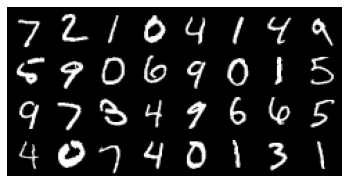

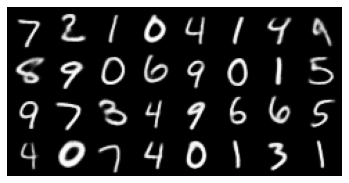

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""

vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
# vae = model_G = torch.jit.load(content_path/'CW_VAE/VAE_model.pth')

vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 6495744 which is ok


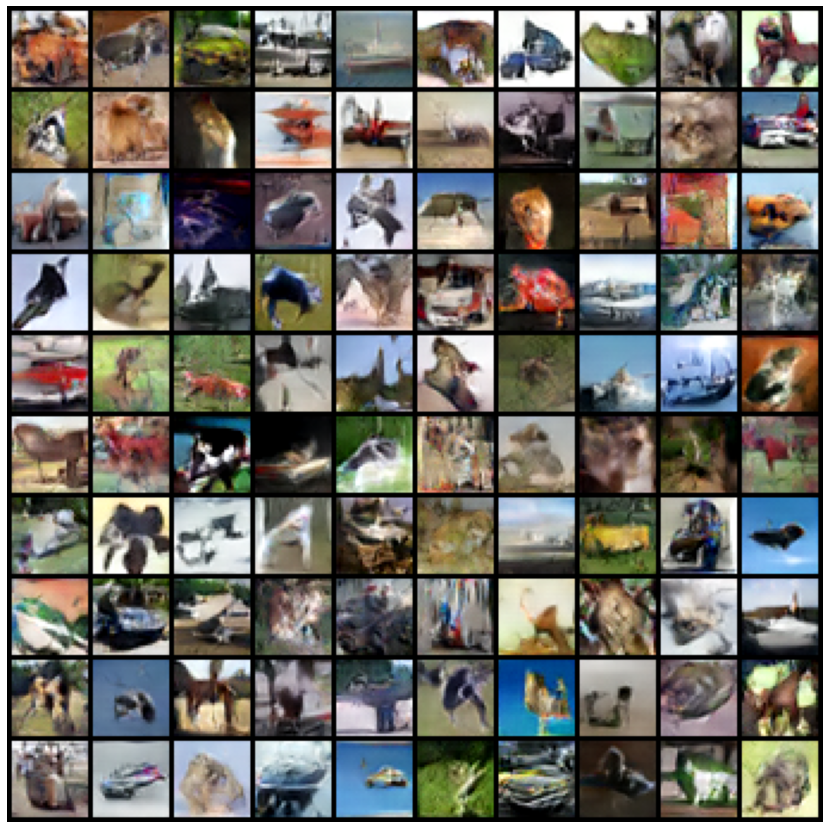

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')

# model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_model.pth')
# model_D = torch.jit.load(content_path/'CW_GAN/GAN_D_model.pth')

[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)